<a href="https://colab.research.google.com/github/AmirAzz/Test/blob/main/Yolo8l10epochaddnewimages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Apr  3 08:00:20 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 25.6/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [4]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 KB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 KB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 6.0 MB/s eta 0:00:00


In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="vi4sAIgCTFi0H4tZwvA4")
project = rf.workspace("kios-alpsc").project("rescuenet-yolo8")
dataset = project.version(6).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to RescueNet-YOLO8-6 in yolov8:: 100%|██████████| 14044/14044 [00:13<00:00, 1051.32it/s]


In [6]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8l.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True

/content
100% 83.7M/83.7M [00:00<00:00, 364MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8l.yaml, data=/content/datasets/RescueNet-YOLO8-6/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras

In [10]:
!ls {HOME}/runs/detect/train/

args.yaml					    train_batch1.jpg
confusion_matrix.png				    train_batch2.jpg
events.out.tfevents.1680510888.110d630a5aa5.9460.0  val_batch0_labels.jpg
F1_curve.png					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    val_batch2_labels.jpg
results.png					    val_batch2_pred.jpg
train_batch0.jpg				    weights


/content


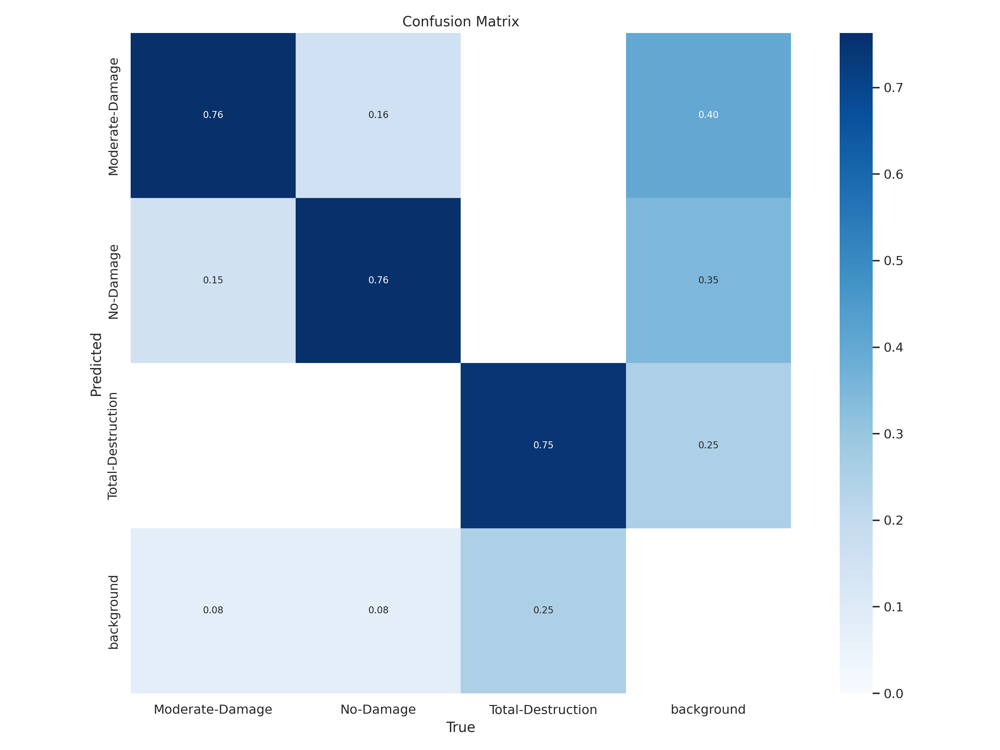

In [12]:
from IPython.display import Image
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


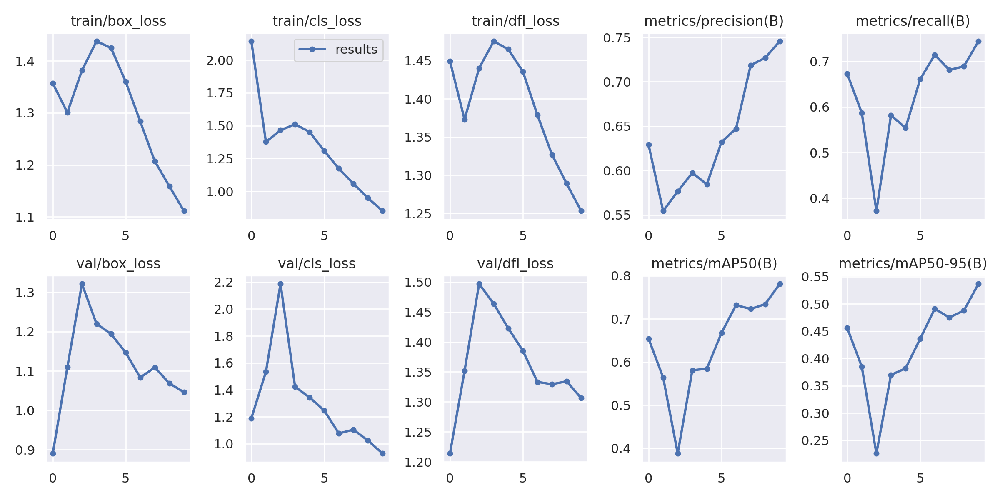

In [13]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content


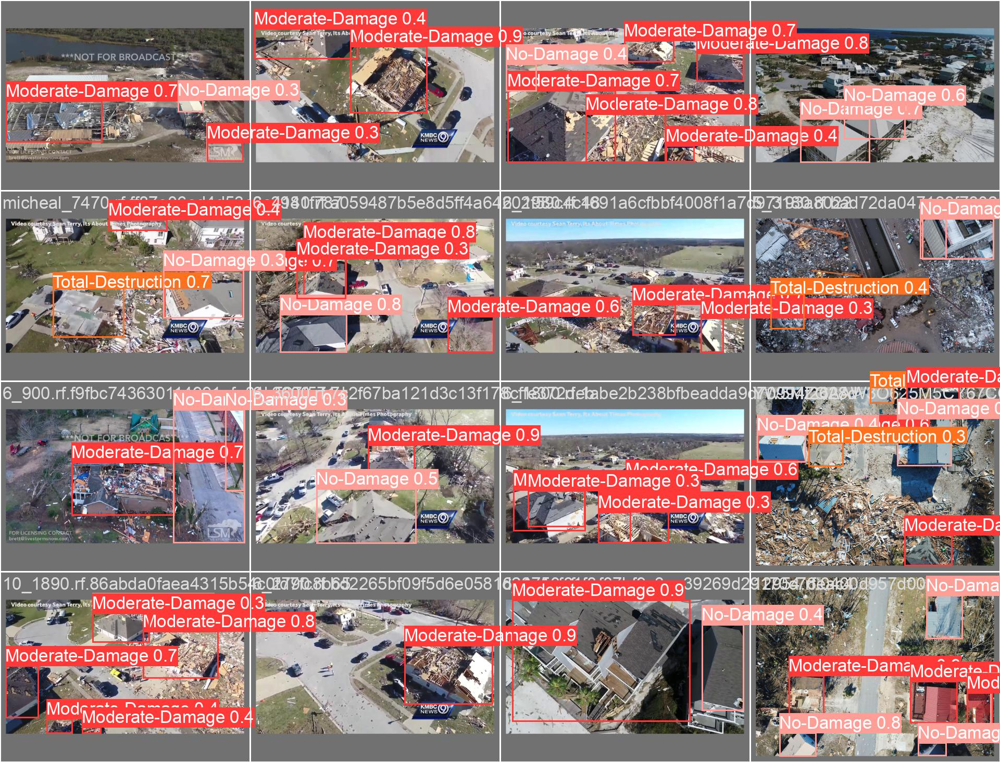

In [14]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

In [15]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
val: Scanning /content/datasets/RescueNet-YOLO8-6/valid/labels.cache... 254 images, 0 backgrounds, 0 corrupt: 100% 254/254 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 16/16 [00:22<00:00,  1.39s/it]
                   all        254        927      0.745      0.744      0.781      0.537
       Moderate-Damage        254        249      0.638      0.807       0.78      0.561
             No-Damage        254        399      0.827      0.797      0.864       0.67
     Total-Destruction        254        279       0.77      0.627        0.7       0.38
Speed: 1.5ms pre-process, 26.2ms inference, 0.0ms loss, 4.8ms post-process per image


In [16]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
image 1/175 /content/datasets/RescueNet-YOLO8-6/test/images/10794.rf.553b054fd118d12f71531389fcfcd41e.jpg: 480x640 1 Total-Destruction, 53.0ms
image 2/175 /content/datasets/RescueNet-YOLO8-6/test/images/10794.rf.af21f5b4ef690f2c082234eefb51139d.jpg: 480x640 1 Total-Destruction, 46.9ms
image 3/175 /content/datasets/RescueNet-YOLO8-6/test/images/10801-Copy.rf.778c4518466aad1066312216d116251a.jpg: 480x640 1 No-Damage, 5 Total-Destructions, 47.0ms
image 4/175 /content/datasets/RescueNet-YOLO8-6/test/images/11388.rf.b48f4e9461d26c45223cde20178aba0e.jpg: 480x640 4 No-Damages, 47.0ms
image 5/175 /content/datasets/RescueNet-YOLO8-6/test/images/11415.rf.ac6e4f6bcf63cc84a0a49af4a20391be.jpg: 480x640 1 Moderate-Damage, 1 No-Damage, 46.9ms
image 6/175 /content/datasets/RescueNet-YOLO8-6/test/images/11419.rf.f985e88fc2916a6

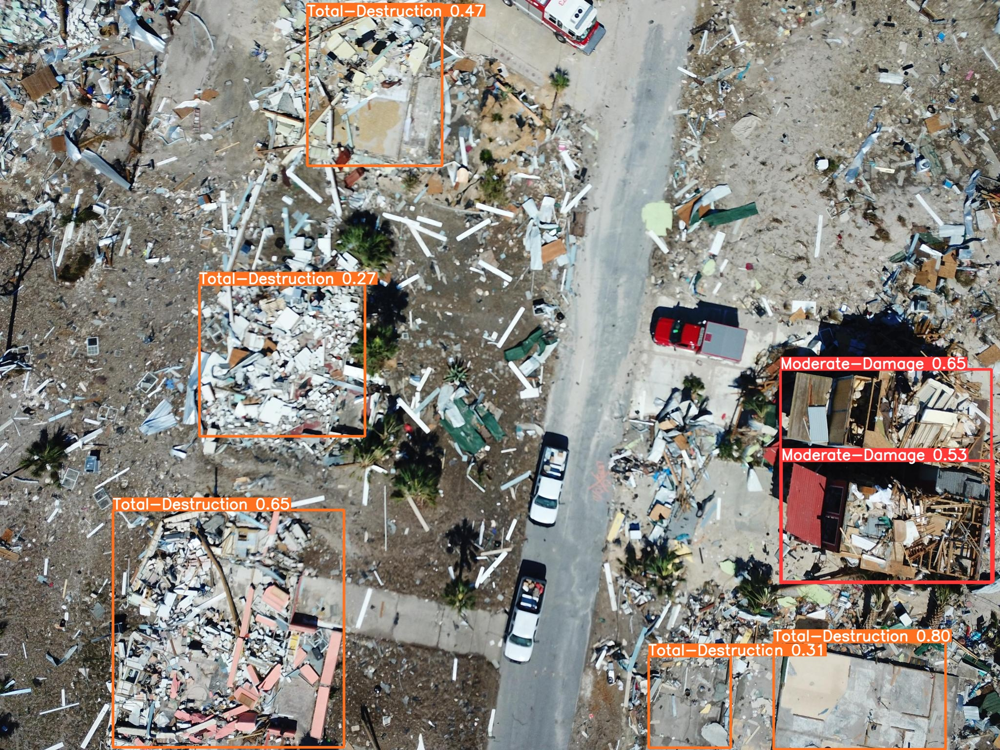

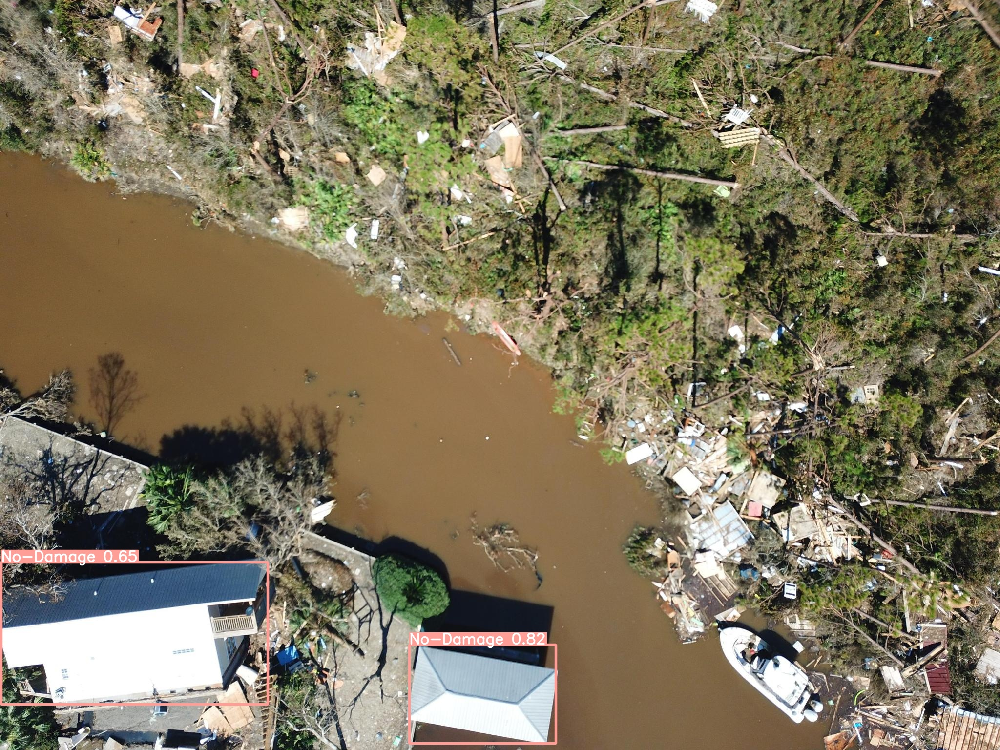

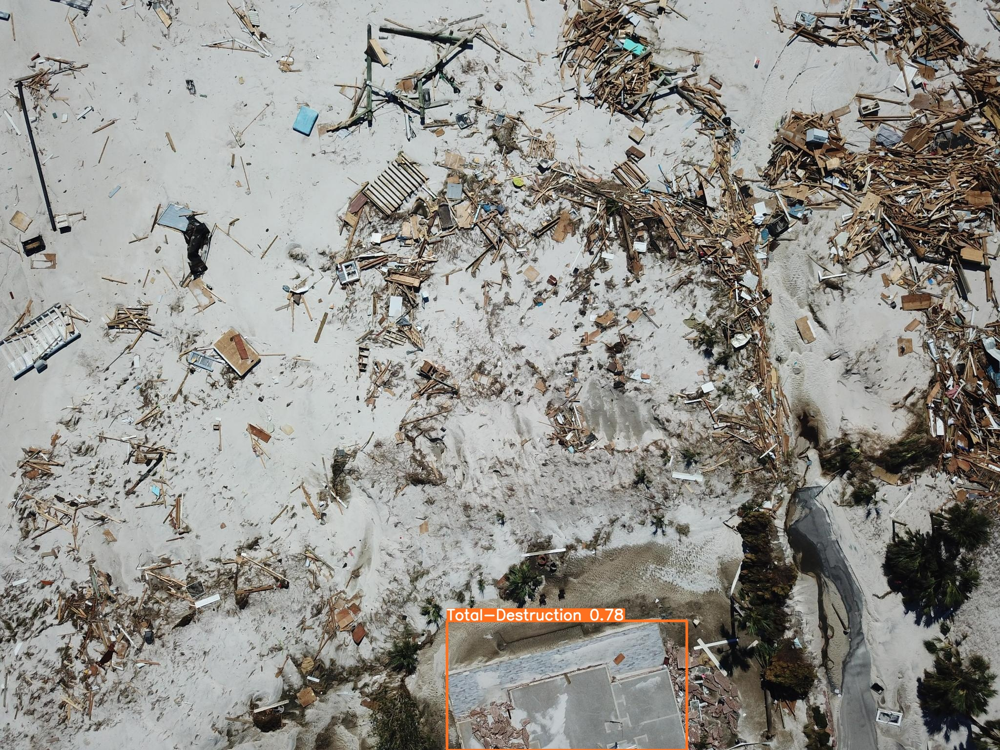

In [17]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/L4O47RWJTVC64SDUYLPMF4Q4RM.jpg save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43612005 parameters, 0 gradients, 164.8 GFLOPs
image 1/1 /content/L4O47RWJTVC64SDUYLPMF4Q4RM.jpg: 480x640 2 Moderate-Damages, 48.9ms
Speed: 0.7ms pre-process, 48.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


In [18]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/datasets/RescueNet-YOLO8-6/test/Turkey save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
image 1/5 /content/datasets/RescueNet-YOLO8-6/test/Turkey/1247075743.jpeg: 384x640 3 Moderate-Damages, 1 No-Damage, 3 Total-Destructions, 40.1ms
image 2/5 /content/datasets/RescueNet-YOLO8-6/test/Turkey/7_2520.jpg: 384x640 2 Moderate-Damages, 1 No-Damage, 30.4ms
image 3/5 /content/datasets/RescueNet-YOLO8-6/test/Turkey/7_3330.jpg: 384x640 1 Moderate-Damage, 1 No-Damage, 30.4ms
image 4/5 /content/datasets/RescueNet-YOLO8-6/test/Turkey/_128538275_1024agettyimages-1246841586.jpg: 384x640 1 Moderate-Damage, 2 Total-Destructions, 30.4ms
image 5/5 /content/datasets/RescueNet-YOLO8-6/test/Turkey/skynews-turkey-earthquake-drone_6052144.jpg: 384x640 4 Moderate-Damages, 3 No-Damages, 5 Total-Destructions, 30.3ms
Speed: 0.5ms pre-process, 32.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results save

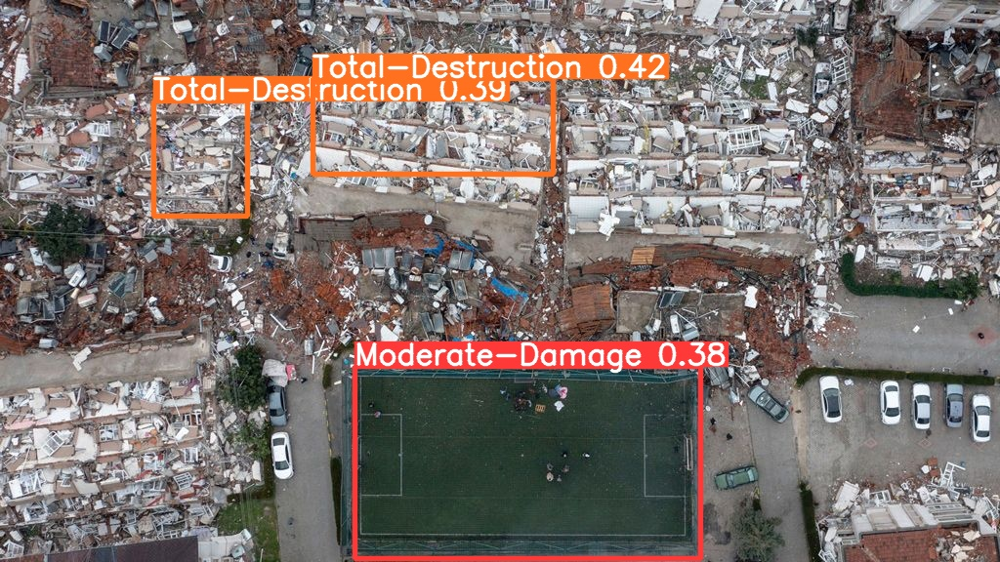

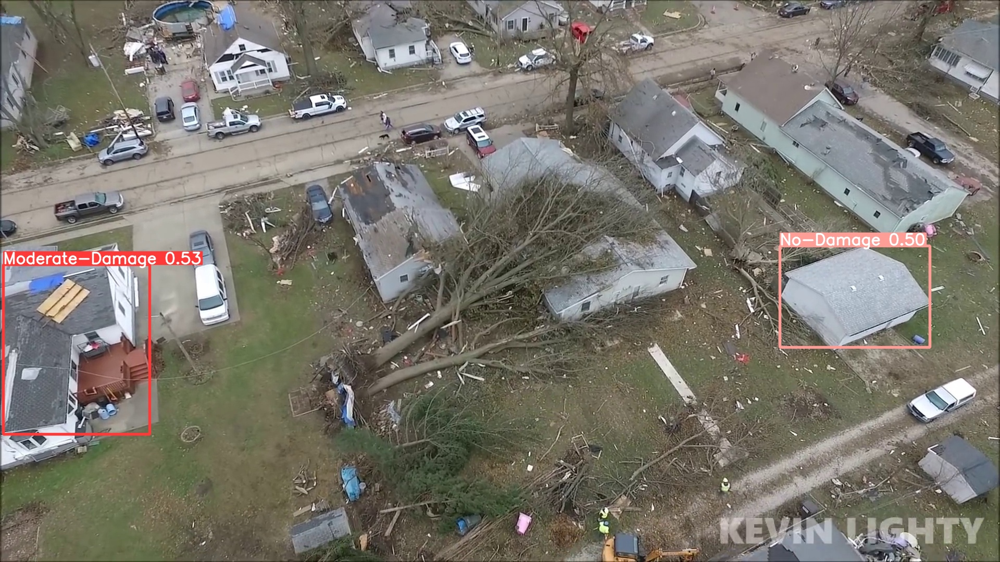

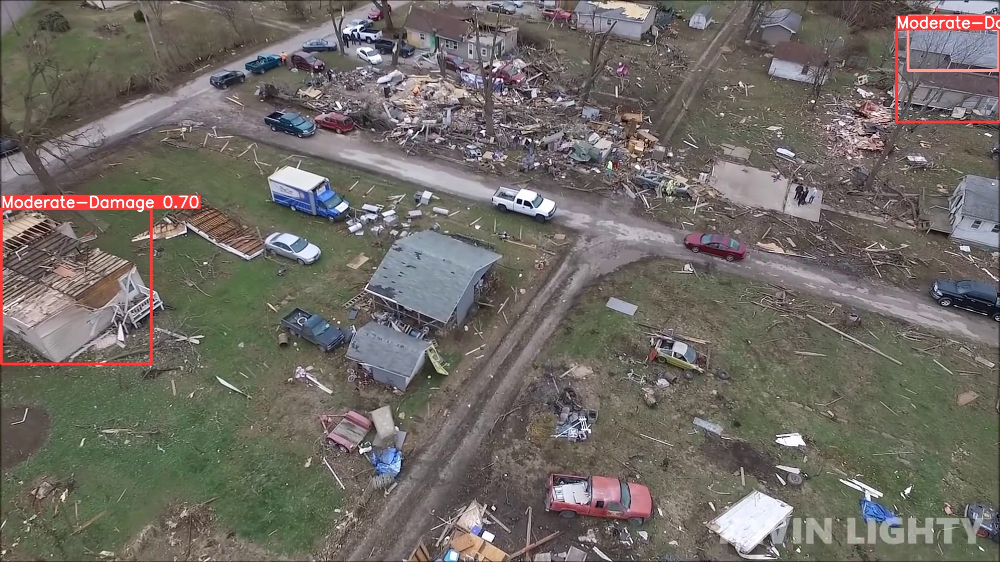

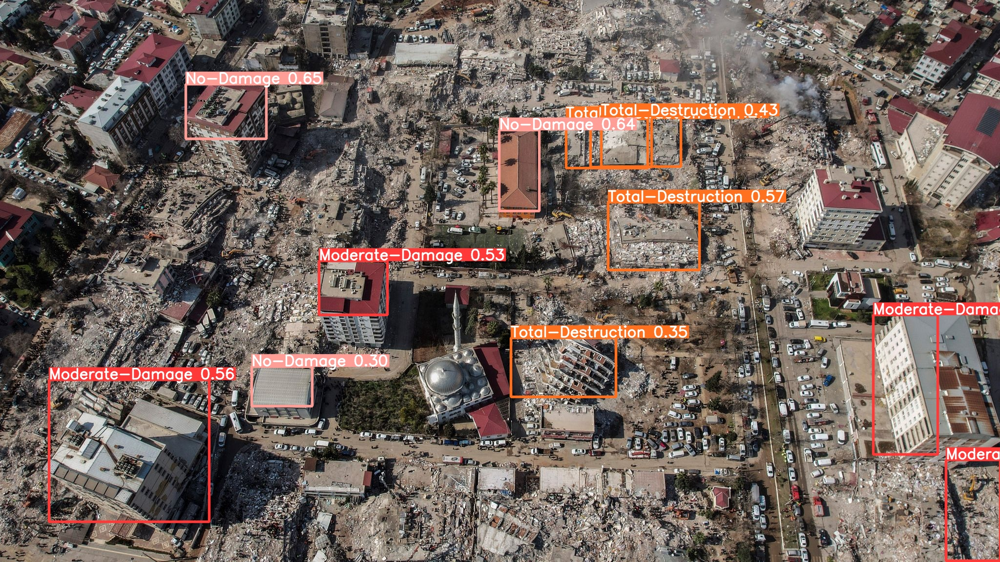

In [19]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg')[:5]:
      display(Image(filename=image_path, width=600))
      print("\n")